In [9]:
import pandas as pd
import numpy as np
import ast
import matplotlib.pyplot as plt
import category_encoders as ce
import xgboost as xgb
import warnings

from sklearn.model_selection import train_test_split,RandomizedSearchCV,cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, OneHotEncoder,MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from category_encoders import TargetEncoder
from scipy.stats import randint, uniform
from xgboost import XGBRegressor


In [10]:
path='C:/Users/nicol/OneDrive/Documentos/VSCLocal/Data/TFM/'

In [11]:
df=pd.read_csv(path+'datos_procesados_01_2025.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9616 entries, 0 to 9615
Data columns (total 25 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   propertyCode                   9616 non-null   int64  
 1   price                          9616 non-null   float64
 2   floor                          9616 non-null   int64  
 3   propertyType                   9616 non-null   object 
 4   size                           9616 non-null   float64
 5   exterior                       9616 non-null   int64  
 6   rooms                          9616 non-null   int64  
 7   bathrooms                      9616 non-null   int64  
 8   district                       9616 non-null   object 
 9   neighborhood                   9616 non-null   object 
 10  latitude                       9616 non-null   float64
 11  longitude                      9616 non-null   float64
 12  distance                       9616 non-null   i

In [12]:
df.columns

Index(['propertyCode', 'price', 'floor', 'propertyType', 'size', 'exterior',
       'rooms', 'bathrooms', 'district', 'neighborhood', 'latitude',
       'longitude', 'distance', 'status', 'newDevelopment', 'hasLift',
       'priceByArea', 'newDevelopmentFinished', 'Month', 'province',
       'hasParkingSpace', 'isParkingSpaceIncludedInPrice', 'parkingSpacePrice',
       'priceByAreaByDistrict', 'priceByAreaByneighborhood'],
      dtype='object')

In [13]:
df.describe()

,propertyCode,price,floor,size,exterior,rooms,bathrooms,latitude,longitude,distance,newDevelopment,hasLift,priceByArea,newDevelopmentFinished,hasParkingSpace,isParkingSpaceIncludedInPrice,parkingSpacePrice,priceByAreaByDistrict,priceByAreaByneighborhood
count,9.616000e+03,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000,9616.000000
mean,1.058053e+08,384751.778598,2.274334,90.715537,0.764351,2.282030,1.448523,40.416531,-3.685282,4579.679908,0.094218,0.641431,4863.394551,0.004472,0.225562,0.200499,675.284630,4863.394551,4863.394551
std,4.501177e+06,208230.598308,2.184337,764.965984,0.424426,1.022225,0.611429,0.034229,0.042170,2926.238319,0.292147,0.479605,2244.658032,0.066725,0.417973,0.400395,4743.465552,1669.892289,1818.032135
min,1.751620e+05,12000.000000,-2.000000,12.000000,0.000000,1.000000,1.000000,40.331386,-3.833162,20.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,2424.011682,1518.982456
25%,1.059852e+08,220000.000000,1.000000,59.000000,1.000000,2.000000,1.000000,40.391618,-3.709303,2276.750000,0.000000,0.000000,3158.000000,0.000000,0.000000,0.000000,0.000000,3273.364821,3227.723214
50%,1.066102e+08,335000.000000,2.000000,76.000000,1.000000,2.000000,1.000000,40.414520,-3.696608,4204.500000,0.000000,1.000000,4500.000000,0.000000,0.000000,0.000000,0.000000,4945.847059,4595.904110
75%,1.069105e+08,529000.000000,3.000000,101.000000,1.000000,3.000000,2.000000,40.437284,-3.663827,6528.750000,0.000000,1.000000,6200.000000,0.000000,0.000000,0.000000,0.000000,6548.581737,6321.630435
max,1.072676e+08,850000.000000,21.000000,75000.000000,1.000000,14.000000,10.000000,40.520552,-3.535710,14222.000000,1.000000,1.000000,18667.000000,1.000000,1.000000,1.000000,100000.000000,8061.320652,10598.701493


In [14]:
df[['price','size','priceByArea']]

,price,size,priceByArea
0,195000.0,51.0,3824.0
1,69500.0,25.0,2780.0
2,480000.0,80.0,6000.0
3,104000.0,63.0,1651.0
4,83000.0,103.0,806.0
...,...,...,...
9611,186000.0,95.0,1958.0
9612,600000.0,60.0,10000.0
9613,385000.0,100.0,3850.0
9614,299000.0,40.0,7475.0


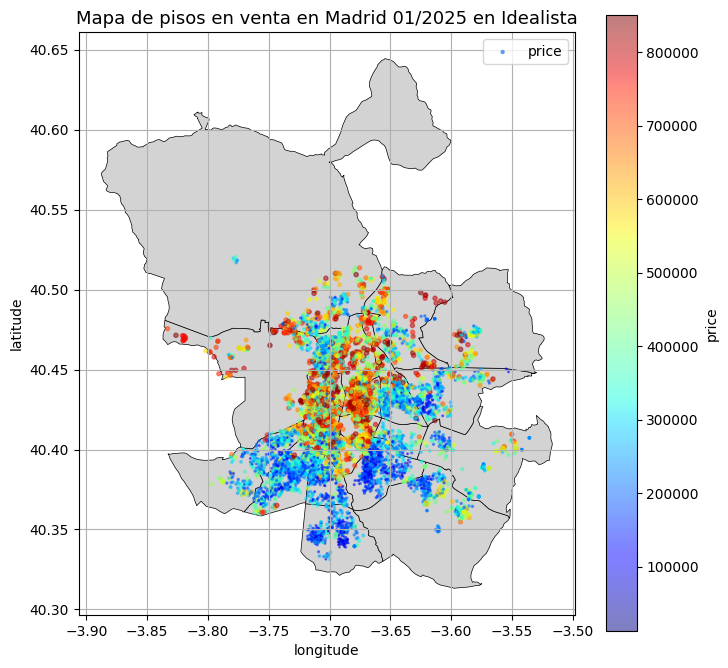

In [15]:
import pandas as pd
import geopandas as gpd

path="C:/Users/nicol/OneDrive/Documentos/VSCLocal/Data/TFM/"
madrid_districts = gpd.read_file(path+"madrid_districts.geojson")
fig, ax = plt.subplots(figsize=(8, 8))


madrid_districts.plot(ax=ax, color='lightgray', edgecolor='black', alpha=1, linewidth=0.5)



df.plot(kind="scatter", x="longitude", y="latitude", grid=True,
            s=df["price"] / 90000, label="price",
            c="price", cmap="jet", colorbar=True,
            legend=True, sharex=False, ax=ax,alpha=0.5)
ax.set_title("Mapa de pisos en venta en Madrid 01/2025 en Idealista", fontsize=13)
ax.legend()


plt.show()

In [40]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium.features import GeoJson, Choropleth

# Ruta de los archivos
path = "C:/Users/nicol/OneDrive/Documentos/VSCLocal/Data/TFM/"

# Cargar datos
df=pd.read_csv(path+'datos_procesados_01_2025.csv')
madrid_districts = gpd.read_file(path + "madrid_districts.geojson")

# Convertir df a GeoDataFrame
df['geometry'] = df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
df_geo = gpd.GeoDataFrame(df, geometry='geometry')
df_geo.set_crs(epsg=4326, inplace=True)

# Realizar la unión espacial
join = gpd.sjoin(df_geo, madrid_districts, how='inner', predicate='within')

# Contabilizar puntos por distrito
count = join['name'].value_counts()
count_df = count.reset_index()
count_df.columns = ['name', 'points_count']

# Unir el conteo al GeoDataFrame de distritos
madrid_districts_with_count = madrid_districts.merge(count_df, on='name', how='left')
madrid_districts_with_count['points_count'] = madrid_districts_with_count['points_count'].fillna(0)

# Convertir columnas de tipo Timestamp a cadenas (si es necesario)
for col in madrid_districts_with_count.columns:
    if pd.api.types.is_datetime64_any_dtype(madrid_districts_with_count[col]):
        madrid_districts_with_count[col] = madrid_districts_with_count[col].astype(str)

# Crear el mapa base con Folium
m = folium.Map(location=[40.416775, -3.703790], zoom_start=12)

# Añadir capa de coropletas
Choropleth(
    geo_data=madrid_districts_with_count,
    name='choropleth',
    data=madrid_districts_with_count,
    columns=['name', 'points_count'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.2,
    line_opacity=0.01,
    legend_name='Número de pisos'
).add_to(m)

# Añadir puntos al mapa
for idx, row in df_geo.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=0.01,
                        color='green',
                        fill=True,
                        fill_color='green',
                        fill_opacity=0.01).add_to(m)

# Añadir anotaciones con el conteo de puntos por distrito
for idx, row in madrid_districts_with_count.iterrows():
    centroid = row['geometry'].centroid
    folium.Marker([centroid.y, centroid.x],
                  icon=folium.DivIcon(html=f"""<div style="font-size: 9pt; color : black">{int(row['points_count'])}</div>""")).add_to(m)

# Añadir control de capas
folium.LayerControl().add_to(m)

# Guardar el mapa en un archivo HTML
m.save('madrid_pisos.html')

# Mostrar el mapa en Jupyter Notebook (si estás utilizando un Jupyter Notebook)
m

In [42]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium.features import GeoJson, Choropleth

# Ruta de los archivos
path = "C:/Users/nicol/OneDrive/Documentos/VSCLocal/Data/TFM/"

# Cargar datos
df = pd.read_csv(path + 'datos_procesados_01_2025.csv')
madrid_districts = gpd.read_file(path + "madrid_districts.geojson")

# Convertir df a GeoDataFrame
df['geometry'] = df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
df_geo = gpd.GeoDataFrame(df, geometry='geometry')
df_geo.set_crs(epsg=4326, inplace=True)

# Realizar la unión espacial
join = gpd.sjoin(df_geo, madrid_districts, how='inner', predicate='within')

# Contabilizar puntos por distrito
count = join['name'].value_counts()
count_df = count.reset_index()
count_df.columns = ['name', 'points_count']

# Unir el conteo al GeoDataFrame de distritos
madrid_districts_with_count = madrid_districts.merge(count_df, on='name', how='left')
madrid_districts_with_count['points_count'] = madrid_districts_with_count['points_count'].fillna(0)

# Convertir columnas de tipo Timestamp a cadenas (si es necesario)
for col in madrid_districts_with_count.columns:
    if pd.api.types.is_datetime64_any_dtype(madrid_districts_with_count[col]):
        madrid_districts_with_count[col] = madrid_districts_with_count[col].astype(str)

# Crear el mapa base con Folium (ajustado para mostrar Cataluña)
m = folium.Map(location=[41.5912, 1.5209], zoom_start=8)  # Cambiar la ubicación y zoom

# Añadir capa de coropletas con bordes negros y mayor transparencia
Choropleth(
    geo_data=madrid_districts_with_count,
    name='choropleth',
    data=madrid_districts_with_count,
    columns=['name', 'points_count'],
    key_on='feature.properties.name',
    fill_color='OrRd',
    fill_opacity=0.2,  # Mayor transparencia
    line_opacity=0.8,  # Bordes más definidos
    line_color='black',  # Bordes negros
    legend_name='Número de pisos'
).add_to(m)

# Añadir puntos al mapa con color amarillo y borde oscuro
for idx, row in df_geo.iterrows():
    folium.CircleMarker(
        [row['latitude'], row['longitude']],
        radius=2,  # Tamaño reducido
        color='black',  # Borde oscuro
        fill=True,
        fill_color='yellow',  # Color amarillo para los puntos
        fill_opacity=0.4
    ).add_to(m)

# Añadir anotaciones con el conteo de puntos por distrito
for idx, row in madrid_districts_with_count.iterrows():
    centroid = row['geometry'].centroid
    folium.Marker(
        [centroid.y, centroid.x],
        icon=folium.DivIcon(html=f"""<div style="font-size: 9pt; color : black">{int(row['points_count'])}</div>""")
    ).add_to(m)

# Añadir un ícono de cierre en la parte superior (simulando la X negra)
folium.map.Marker(
    [42.3, 2.2],
    icon=folium.DivIcon(html='''<div style="font-size: 20pt; color: black; font-weight: bold;">&#10006;</div>''')
).add_to(m)

# Añadir control de capas
folium.LayerControl().add_to(m)

# Guardar el mapa en un archivo HTML
m.save('madrid_pisos.html')

# Mostrar el mapa en Jupyter Notebook (si estás utilizando un Jupyter Notebook)
m


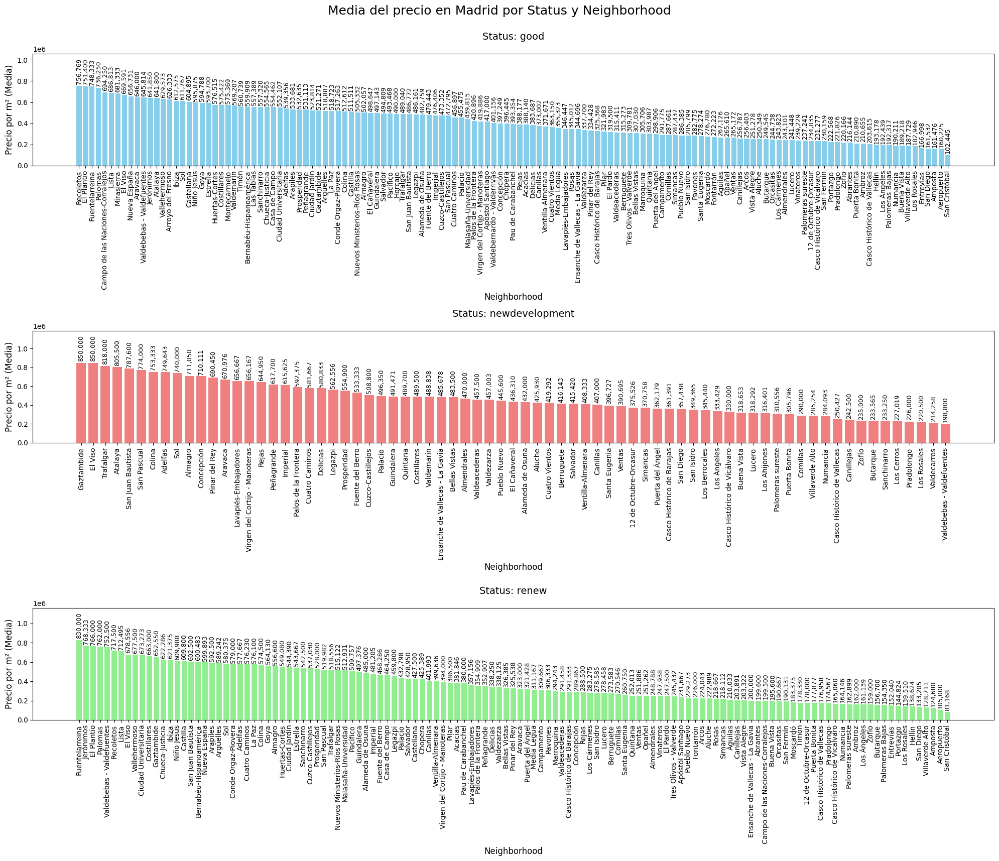

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Filtrar datos para Madrid
madrid_data = df

# Calcular la media del precio por metro cuadrado agrupada por 'status' y 'neighborhood'
mean_price = madrid_data.groupby(['status', 'neighborhood'])['price'].mean().reset_index()

# Crear subgráficos para cada 'status'
statuses = mean_price['status'].unique()

# Lista de colores personalizados
colors = ['skyblue', 'lightcoral', 'lightgreen']  # Colores para cada subplot

# Crear subplots
fig, axes = plt.subplots(nrows=len(statuses), ncols=1, figsize=(20, 6 * len(statuses)))  # Sin sharex

# Si solo hay un status, convierte axes en una lista
if len(statuses) == 1:
    axes = [axes]

# Dibujar un gráfico vertical por cada 'status' con un color único
for ax, status, color in zip(axes, statuses, colors):
    subset = mean_price[mean_price['status'] == status]
    subset = subset.sort_values('price', ascending=False)  # Ordenar por precio
    
    # Dibujar las barras
    bars = ax.bar(subset['neighborhood'], subset['price'], color=color)
    
    # Ajustar el límite del eje Y con margen adicional
    y_max = subset['price'].max() * 1.4  # 30% de margen superior
    ax.set_ylim(0, y_max)
    
    # Añadir el valor encima de cada barra en vertical
    for bar in bars:
        height = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,  # Posición X centrada
            height + (y_max * 0.01),           # Posición Y ajustada con margen fijo
            f'{height:,.0f}',                  # Formato con separación de miles
            ha='center', va='bottom', fontsize=9, color='black', rotation=90  # Rotar texto verticalmente
        )
    
    ax.set_title(f'Status: {status}', fontsize=14, pad=20)  # Separar el título del subplot
    ax.set_xlabel('Neighborhood', fontsize=12)  # Etiqueta del eje X
    ax.set_ylabel('Precio por m² (Media)', fontsize=12)
    ax.tick_params(axis='x', rotation=90)  # Rotar etiquetas del eje X

# Configuraciones globales del gráfico
plt.suptitle('Media del precio en Madrid por Status y Neighborhood', 
             fontsize=18, y=0.95)  # Mover el título principal hacia arriba

# Ajustar el espaciado vertical entre subplots
plt.subplots_adjust(top=0.88, hspace=0.6)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Ajustar la distribución de los subplots
plt.show()


In [18]:
def feature_engineering(df):

    def calculate_mean_price_by_district(df):
        """
        Calcula la media de 'priceByArea' por distrito y crea una nueva columna 'priceByAreaByDistrict' en el DataFrame.
        
        :param df: DataFrame que contiene las columnas 'district' y 'priceByArea'.
        :return: DataFrame con la nueva columna 'priceByAreaByDistrict'.
        """
        # Calcular la media de 'priceByArea' por distrito
        mean_price_by_district = df[['district', 'priceByArea']].groupby('district').mean()

        # Crear un diccionario a partir de la serie resultante
        mean_price_dict = mean_price_by_district['priceByArea'].to_dict()

        # Crear la nueva columna 'priceByAreaByDistrict' en el DataFrame original
        df['priceByAreaByDistrict'] = df['district'].map(mean_price_dict)
        
        return df

    def calculate_mean_price_by_neighborhood(df):
        """
        Calcula la media de 'priceByArea' por vecindario y crea una nueva columna 'priceByAreaByneighborhood' en el DataFrame.
        
        :param df: DataFrame que contiene las columnas 'neighborhood' y 'priceByArea'.
        :return: DataFrame con la nueva columna 'priceByAreaByneighborhood'.
        """
        # Calcular la media de 'priceByArea' por vecindario
        mean_price_by_neighborhood = df[['neighborhood', 'priceByArea']].groupby('neighborhood').mean()

        # Crear un diccionario a partir de la serie resultante
        mean_price_dict = mean_price_by_neighborhood['priceByArea'].to_dict()

        # Crear la nueva columna 'priceByAreaByneighborhood' en el DataFrame original
        df['priceByAreaByneighborhood'] = df['neighborhood'].map(mean_price_dict)
        
        return df

    def calculate_additional_columns(df):
        """
        Calcula las columnas adicionales 'roomSize', 'bathroomSize', 'bathroomRoom' y 'liftFloorInteraction'.
        
        :param df: DataFrame que contiene las columnas 'size', 'rooms', 'bathrooms', 'hasLift', 'floor' y 'propertyType'.
        :return: DataFrame con las nuevas columnas calculadas.
        """
        # Inicializar las nuevas columnas
        df['roomSize'] = 0.0
        df['bathroomSize'] = 0.0
        df['bathroomRoom'] = 0.0
        df['liftFloorInteraction'] = 0

        # Calcular 'roomSize'
        mask_rooms_nonzero = df['rooms'] != 0
        df.loc[mask_rooms_nonzero, 'roomSize'] = (df.loc[mask_rooms_nonzero, 'size'] / df.loc[mask_rooms_nonzero, 'rooms']).astype(float)
        
        # Calcular 'bathroomSize'
        mask_bathrooms_nonzero = df['bathrooms'] != 0
        df.loc[mask_bathrooms_nonzero, 'bathroomSize'] = (df.loc[mask_bathrooms_nonzero, 'size'] / df.loc[mask_bathrooms_nonzero, 'bathrooms']).astype(float)
        
        # Calcular 'bathroomRoom'
        df.loc[mask_rooms_nonzero, 'bathroomRoom'] = (df.loc[mask_rooms_nonzero, 'bathrooms'] / df.loc[mask_rooms_nonzero, 'rooms']).astype(float)
        
        # Calcular 'liftFloorInteraction'
        df['liftFloorInteraction'] = df['hasLift'] * df['floor']
        
        # Ajustar 'roomSize' y 'bathroomRoom' para 'studio' con 'rooms' == 0
        mask_studio_no_rooms = (df['propertyType'] == 'studio') & (df['rooms'] == 0)
        df.loc[mask_studio_no_rooms, 'roomSize'] = 0
        df.loc[mask_studio_no_rooms, 'bathroomRoom'] = 0
        
        return df
    
    df=calculate_mean_price_by_district(df)
    df=calculate_mean_price_by_neighborhood(df)
    df=calculate_additional_columns(df)
    
    return df

feature_engineering_df=feature_engineering(df.copy())

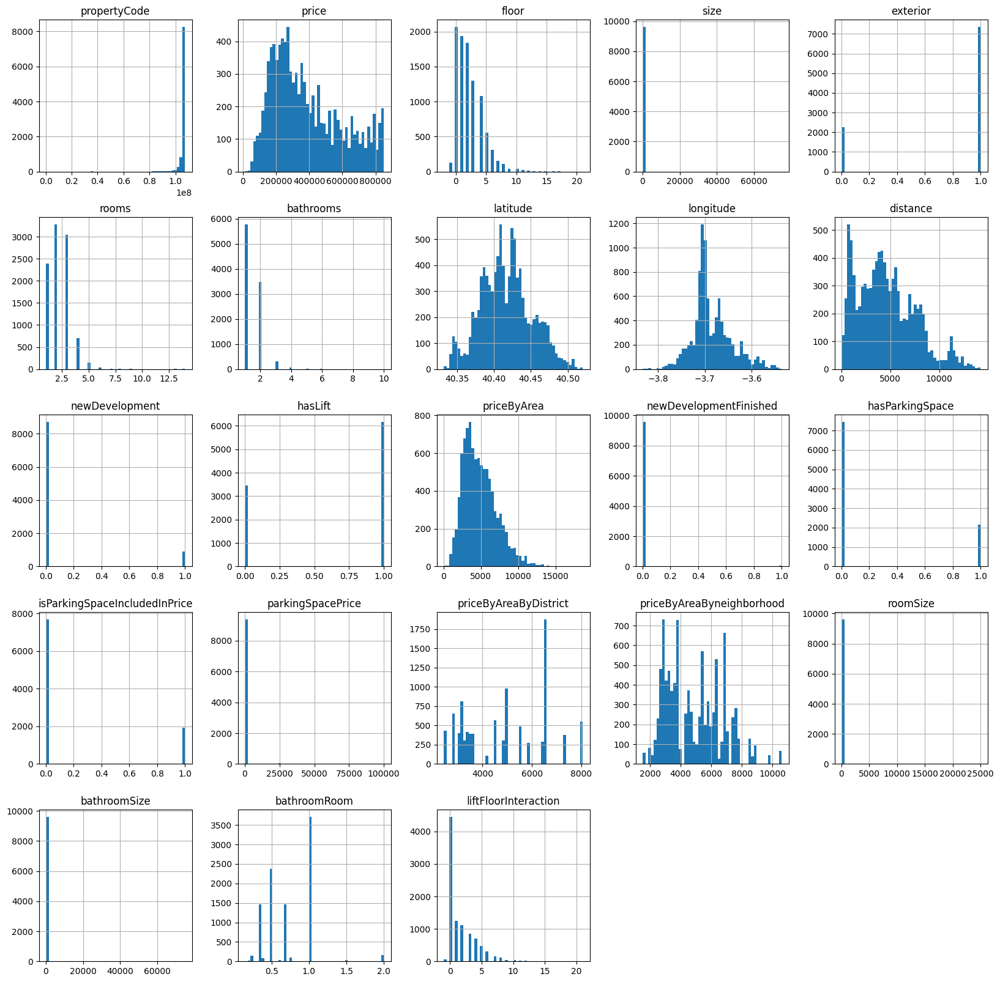

In [19]:
feature_engineering_df.hist(bins=50, figsize=(20, 20))
plt.show()

In [20]:
def LinearRegression_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid):
    # Asegurarse de que las columnas categóricas sean del tipo object
    for feature in categorical_features:
        X_train[feature] = X_train[feature].astype('object')
        X_valid[feature] = X_valid[feature].astype('object')

    # Crear transformador de columnas
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', ce.TargetEncoder(cols=categorical_features, smoothing=0.5), categorical_features)
        ])
    
    # Crear pipeline con preprocesador y modelo
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', LinearRegression())
    ])
    
    # Suprimir advertencias específicas de category_encoders
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        pd.set_option('future.no_silent_downcasting', True)
        
        # Entrenar el modelo
        model.fit(X_train, y_train)
        
        # Hacer predicciones
        y_pred = model.predict(X_valid)
    
    # Calcular métricas
    mae = mean_absolute_error(y_valid, y_pred)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    r2 = r2_score(y_valid, y_pred)
    mape = mean_absolute_percentage_error(y_valid, y_pred)
    
    # Formatear métricas con dos decimales
    mae = round(mae, 2)
    rmse = round(rmse, 2)
    r2 = round(r2, 4)
    mape = round(mape, 4)
    
    print("Resultados de Modelo LinearRegression con TargetEncoder")
    print(f"Cantidad de valores {X_train.shape}")
    
    # Devolver los resultados del MAE, RMSE, R² y MAPE
    return f'RMSE: {rmse}\nMAE: {mae}\nR²: {r2}\nMAPE: {mape}\n'

def RandomForestRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid):
    # Asegurarse de que las columnas categóricas sean del tipo object
    for feature in categorical_features:
        X_train[feature] = X_train[feature].astype('object')
        X_valid[feature] = X_valid[feature].astype('object')

    # Crear transformador de columnas
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', ce.TargetEncoder(cols=categorical_features, smoothing=0.5), categorical_features)
        ])
    
    # Crear pipeline con preprocesador y modelo
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
    ])
    
    # Suprimir advertencias específicas de category_encoders
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        pd.set_option('future.no_silent_downcasting', True)
        
        # Entrenar el modelo
        model.fit(X_train, y_train)
        
        # Hacer predicciones
        y_pred = model.predict(X_valid)
    
    # Calcular métricas
    mae = mean_absolute_error(y_valid, y_pred)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    r2 = r2_score(y_valid, y_pred)
    mape = mean_absolute_percentage_error(y_valid, y_pred)
    
    # Formatear métricas con dos decimales
    mae = round(mae, 2)
    rmse = round(rmse, 2)
    r2 = round(r2, 4)
    mape = round(mape, 4)
    
    print("Resultados de Modelo RandomForestRegressor con TargetEncoder")
    print(f"Cantidad de valores {X_train.shape}")
    
    # Devolver los resultados del MAE, RMSE, R² y MAPE
    return f'RMSE: {rmse}\nMAE: {mae}\nR²: {r2}\nMAPE: {mape}\n'

def GradientBoostingRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid):
    # Asegurarse de que las columnas categóricas sean del tipo object
    for feature in categorical_features:
        X_train[feature] = X_train[feature].astype('object')
        X_valid[feature] = X_valid[feature].astype('object')

    # Crear transformador de columnas
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', ce.TargetEncoder(cols=categorical_features, smoothing=0.5), categorical_features)
        ])
    
    # Crear pipeline con preprocesador y modelo
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', GradientBoostingRegressor(n_estimators=100, random_state=42))
    ])
    
    # Suprimir advertencias específicas de category_encoders
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        pd.set_option('future.no_silent_downcasting', True)
        
        # Entrenar el modelo
        model.fit(X_train, y_train)
        
        # Hacer predicciones
        y_pred = model.predict(X_valid)
    
    # Calcular métricas
    mae = mean_absolute_error(y_valid, y_pred)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    r2 = r2_score(y_valid, y_pred)
    mape = mean_absolute_percentage_error(y_valid, y_pred)
    
    # Formatear métricas con dos decimales
    mae = round(mae, 2)
    rmse = round(rmse, 2)
    r2 = round(r2, 4)
    mape = round(mape, 4)
    
    print("Resultados de Modelo GradientBoostingRegressor con TargetEncoder")
    print(f"Cantidad de valores {X_train.shape}")
    
    # Devolver los resultados del MAE, RMSE, R² y MAPE
    return f'RMSE: {rmse}\nMAE: {mae}\nR²: {r2}\nMAPE: {mape}\n'

def XGBRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid):
    # Asegurarse de que las columnas categóricas sean del tipo object
    for feature in categorical_features:
        X_train[feature] = X_train[feature].astype('object')
        X_valid[feature] = X_valid[feature].astype('object')

    # Crear transformador de columnas
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', ce.TargetEncoder(cols=categorical_features, smoothing=0.5), categorical_features)
        ])
    
    # Crear pipeline con preprocesador y modelo
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', XGBRegressor(n_estimators=100, random_state=42))
    ])
    
    # Suprimir advertencias específicas de category_encoders
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        pd.set_option('future.no_silent_downcasting', True)
        
        # Entrenar el modelo
        model.fit(X_train, y_train)
        
        # Hacer predicciones
        y_pred = model.predict(X_valid)
    
    # Calcular métricas
    mae = mean_absolute_error(y_valid, y_pred)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    r2 = r2_score(y_valid, y_pred)
    mape = mean_absolute_percentage_error(y_valid, y_pred)
    
    # Formatear métricas con dos decimales
    mae = round(mae, 2)
    rmse = round(rmse, 2)
    r2 = round(r2, 4)
    mape = round(mape, 4)
    
    print("Resultados de Modelo XGBRegressor con TargetEncoder")
    print(f"Cantidad de valores {X_train.shape}")
    
    # Devolver los resultados del MAE, RMSE, R² y MAPE
    return f'RMSE: {rmse}\nMAE: {mae}\nR²: {r2}\nMAPE: {mape}\n'

    # Selecciona las características (X) y la variable objetivo (y)
    data = feature_engineering_df[(feature_engineering_df['province']=='Madrid') & (feature_engineering_df['price']<=800000)]
    X = data.drop(['propertyCode', 'price', 'Month', 'province'], axis=1)
    y = data['price']

    # Guardamos las variables númercias
    numeric_features=list(X.select_dtypes(exclude=['object']).columns)
    # Guardamos las variables categóricas
    categorical_features=list(X.select_dtypes(include=['object']).columns)


    # Guarda el índice original para poder hacer el merge después
    X['propertyCode'] = data['propertyCode']

    # Divide los datos en conjuntos de entrenamiento y validación
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=42)

    # Define transformaciones para las variables categóricas y numéricas
    categorical_transformer = TargetEncoder()

    numeric_features = ['priceByArea', 'floor', 'size', 'rooms', 'bathrooms', 'distance', 'latitude', 'longitude',
                        'hasLift', 'hasParkingSpace', 'isParkingSpaceIncludedInPrice', 'parkingSpacePrice', 
                        'priceByAreaByDistrict', 'priceByAreaByneighborhood', 'roomSize', 'bathroomSize', 
                        'bathroomRoom', 'liftFloorInteraction']
    numeric_transformer = StandardScaler()

    # Define el preprocesamiento de las características
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ])

    # Combina preprocesamiento y modelo en un pipeline
    model = Pipeline(steps=[('preprocessor', preprocessor),
                            ('regressor', GradientBoostingRegressor(random_state=42))])

    # Define la distribución de hiperparámetros para la búsqueda aleatoria
    param_dist = {
        'regressor__n_estimators': randint(100, 1000),
        'regressor__learning_rate': uniform(0.01, 0.2),
        'regressor__max_depth': randint(3, 10),
        'regressor__min_samples_split': randint(2, 20),
        'regressor__min_samples_leaf': randint(1, 10),
        'regressor__subsample': uniform(0.7, 0.3)
    }

    # Aplica la búsqueda aleatoria de hiperparámetros
    random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)
    random_search.fit(X_train.drop(columns='propertyCode'), y_train)

    # Obtiene el mejor modelo
    best_model = random_search.best_estimator_

    # Evalúa el modelo en el conjunto de prueba
    y_pred = best_model.predict(X_valid.drop(columns='propertyCode'))
    mse = mean_squared_error(y_valid, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_valid, y_pred)

    # Imprimir resultados
    print("Mejores hiperparámetros:", random_search.best_params_)
    print("Mean Squared Error:", mse)
    print("Root Mean Squared Error:", rmse)
    print("Mean Absolute Error:", mae)

    # Crear un DataFrame con las predicciones y el propertyCode
    results_df = pd.DataFrame({'propertyCode': X_valid['propertyCode'], 'Predicted_Price': y_pred})

    # Hacer un merge con el DataFrame original para obtener los precios reales
    merged_df_Difference = pd.merge(results_df, data[['propertyCode', 'price']], on='propertyCode', how='inner')

    # Agregar una columna para la diferencia entre el precio real y el predicho
    merged_df_Difference['Difference'] = merged_df_Difference['price'] - merged_df_Difference['Predicted_Price']

    return best_model, random_search.best_params_, rmse, mae, merged_df_Difference


def optimize_RandomForestRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid):
    # Asegurarse de que las columnas categóricas sean del tipo object
    for feature in categorical_features:
        X_train[feature] = X_train[feature].astype('object')
        X_valid[feature] = X_valid[feature].astype('object')

    # Crear transformador de columnas
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', ce.TargetEncoder(cols=categorical_features, smoothing=0.5), categorical_features)
        ])
    
    # Definir el pipeline con preprocesador y modelo
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', RandomForestRegressor(random_state=42))
    ])
    
    # Definir el espacio de búsqueda de hiperparámetros
    param_distributions = {
        'regressor__n_estimators': np.arange(50, 301, 50),
        'regressor__max_depth': np.arange(10, 101, 10),
        'regressor__min_samples_split': np.arange(2, 11, 2),
        'regressor__min_samples_leaf': np.arange(1, 11, 2),
        'regressor__max_features': [None, 'sqrt', 'log2'],
        'regressor__bootstrap': [True, False]
    }
    
    # Configurar RandomizedSearchCV
    randomized_search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_distributions,
        n_iter=50,
        cv=5,
        scoring='neg_mean_absolute_error',
        random_state=42,
        n_jobs=-1
    )
    
    # Suprimir advertencias específicas de category_encoders
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        pd.set_option('future.no_silent_downcasting', True)
        
        # Entrenar el modelo usando RandomizedSearchCV
        randomized_search.fit(X_train, y_train)
        
        # Obtener el mejor modelo
        best_model = randomized_search.best_estimator_
        
        # Hacer predicciones
        y_pred = best_model.predict(X_valid)
    
    # Calcular métricas
    mae = mean_absolute_error(y_valid, y_pred)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    r2 = r2_score(y_valid, y_pred)
    mape = mean_absolute_percentage_error(y_valid, y_pred)
    
    # Formatear métricas con dos decimales
    mae = round(mae, 2)
    rmse = round(rmse, 2)
    r2 = round(r2, 4)
    mape = round(mape, 4)
    
    print("Resultados de Modelo RandomForestRegressor con TargetEncoder")
    print(f"Mejores hiperparámetros: {randomized_search.best_params_}")
    print(f"Cantidad de valores {X_train.shape}")
    
    # Obtener importancias de las características
    feature_importances = best_model.named_steps['regressor'].feature_importances_
    feature_names = numeric_features + categorical_features
    feature_importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=False)
    
    print("\nImportancia de las características:")
    print(feature_importance_df)
    
    # Plot de la importancia de las características
    plt.figure(figsize=(10, 6))
    plt.title('Feature Importances')
    plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='blue', alpha=0.6)
    plt.gca().invert_yaxis()
    plt.show()
    
    # Devolver los resultados del MAE, RMSE, R² y MAPE con formato
    return f'RMSE: {rmse}\nMAE: {mae}\nR²: {r2}\nMAPE: {mape}\n'

def optimize_GradientBoostingRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid):
    # Asegurarse de que las columnas categóricas sean del tipo object
    for feature in categorical_features:
        X_train[feature] = X_train[feature].astype('object')
        X_valid[feature] = X_valid[feature].astype('object')

    # Crear transformador de columnas
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', ce.TargetEncoder(cols=categorical_features, smoothing=0.5), categorical_features)
        ])
    
    # Definir el pipeline con preprocesador y modelo
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', GradientBoostingRegressor(random_state=42))
    ])
    
    # Definir el espacio de búsqueda de hiperparámetros
    param_distributions = {
        'regressor__n_estimators': np.arange(50, 301, 50),
        'regressor__max_depth': np.arange(3, 21, 2),
        'regressor__learning_rate': np.logspace(-3, 0, 10),
        'regressor__subsample': np.linspace(0.5, 1.0, 6),
        'regressor__min_samples_split': np.arange(2, 11, 2),
        'regressor__min_samples_leaf': np.arange(1, 11, 2),
    }
    
    # Configurar RandomizedSearchCV
    randomized_search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_distributions,
        n_iter=50,
        cv=5,
        scoring='neg_mean_absolute_error',
        random_state=42,
        n_jobs=-1
    )
    
    # Suprimir advertencias específicas de category_encoders
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        pd.set_option('future.no_silent_downcasting', True)
        
        # Entrenar el modelo usando RandomizedSearchCV
        randomized_search.fit(X_train, y_train)
        
        # Obtener el mejor modelo
        best_model = randomized_search.best_estimator_
        
        # Hacer predicciones
        y_pred = best_model.predict(X_valid)
    
    # Calcular métricas
    mae = mean_absolute_error(y_valid, y_pred)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    r2 = r2_score(y_valid, y_pred)
    mape = mean_absolute_percentage_error(y_valid, y_pred)
    
    # Formatear métricas con dos decimales
    mae = round(mae, 2)
    rmse = round(rmse, 2)
    r2 = round(r2, 4)
    mape = round(mape, 4)
    
    print("Resultados de Modelo GradientBoostingRegressor con TargetEncoder")
    print(f"Mejores hiperparámetros: {randomized_search.best_params_}")
    print(f"Cantidad de valores {X_train.shape}")
    
    # Obtener importancias de las características
    feature_importances = best_model.named_steps['regressor'].feature_importances_
    feature_names = numeric_features + categorical_features
    feature_importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=False)
    
    print("\nImportancia de las características:")
    print(feature_importance_df)
    
    # Plot de la importancia de las características
    plt.figure(figsize=(10, 6))
    plt.title('Feature Importances')
    plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='blue', alpha=0.6)
    plt.gca().invert_yaxis()
    plt.show()
    
    # Devolver los resultados del MAE, RMSE, R² y MAPE con formato
    return f'RMSE: {rmse}\nMAE: {mae}\nR²: {r2}\nMAPE: {mape}\n'

def optimize_XGBRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid):
    # Asegurarse de que las columnas categóricas sean del tipo object
    for feature in categorical_features:
        X_train[feature] = X_train[feature].astype('object')
        X_valid[feature] = X_valid[feature].astype('object')

    # Crear transformador de columnas
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numeric_features),
            ('cat', ce.TargetEncoder(cols=categorical_features, smoothing=0.5), categorical_features)
        ])
    
    # Definir el pipeline con preprocesador y modelo
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', XGBRegressor(random_state=42))
    ])
    
    # Definir el espacio de búsqueda de hiperparámetros
    param_distributions = {
        'regressor__n_estimators': np.arange(50, 301, 50),
        'regressor__max_depth': np.arange(3, 21, 2),
        'regressor__learning_rate': np.logspace(-3, 0, 10),
        'regressor__subsample': np.linspace(0.5, 1.0, 6),
        'regressor__colsample_bytree': np.linspace(0.5, 1.0, 6),
        'regressor__gamma': np.linspace(0, 5, 11)
    }
    
    # Configurar RandomizedSearchCV
    randomized_search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_distributions,
        n_iter=50,
        cv=5,
        scoring='neg_mean_absolute_error',
        random_state=42,
        n_jobs=-1
    )
    
    # Suprimir advertencias específicas de category_encoders
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=FutureWarning)
        pd.set_option('future.no_silent_downcasting', True)
        
        # Entrenar el modelo usando RandomizedSearchCV
        randomized_search.fit(X_train, y_train)
        
        # Obtener el mejor modelo
        best_model = randomized_search.best_estimator_
        
        # Hacer predicciones
        y_pred = best_model.predict(X_valid)
    
    # Calcular métricas
    mae = mean_absolute_error(y_valid, y_pred)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    r2 = r2_score(y_valid, y_pred)
    mape = mean_absolute_percentage_error(y_valid, y_pred)
    
    # Formatear métricas con dos decimales
    mae = round(mae, 2)
    rmse = round(rmse, 2)
    r2 = round(r2, 4)
    mape = round(mape, 4)
    
    print("Resultados de Modelo XGBRegressor con TargetEncoder")
    print(f"Mejores hiperparámetros: {randomized_search.best_params_}")
    print(f"Cantidad de valores {X_train.shape}")
    
    # Obtener importancias de las características
    feature_importances = best_model.named_steps['regressor'].feature_importances_
    feature_names = numeric_features + categorical_features
    feature_importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=False)
    
    print("\nImportancia de las características:")
    print(feature_importance_df)
    
    # Plot de la importancia de las características
    plt.figure(figsize=(10, 6))
    plt.title('Feature Importances')
    plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='blue', alpha=0.6)
    plt.gca().invert_yaxis()
    plt.show()
    
    # Devolver los resultados del MAE, RMSE, R² y MAPE con formato
    return f'RMSE: {rmse}\nMAE: {mae}\nR²: {r2}\nMAPE: {mape}\n'


def optimize_random_forest_with_TargetEncoder_feature_importance(data):
    # Selecciona las características (X) y la variable objetivo (y)
    data = data[data['province'] == 'Madrid']
    data = data[data['price'] <= 800000]
    X = data.drop(['propertyCode', 'price', 'Month', 'province', 'longitude', 'roomSize', 'latitude', 'distance',
                   'priceByAreaByneighborhood', 'floor', 'district', 'liftFloorInteraction', 'priceByAreaByDistrict',
                   'bathroomRoom', 'parkingSpacePrice', 'rooms', 'propertyType', 'status', 'isParkingSpaceIncludedInPrice',
                   'hasParkingSpace', 'hasLift'], axis=1)
    y = data['price']

    # Guarda el índice original para poder hacer el merge después
    X['propertyCode'] = data['propertyCode']

    # Divide los datos en conjuntos de entrenamiento y validación
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=42)

    # Define transformaciones para las variables categóricas y numéricas
    categorical_features = ['neighborhood']
    categorical_transformer = ce.TargetEncoder()

    numeric_features = ['priceByArea', 'size', 'bathrooms', 'bathroomSize']
    numeric_transformer = StandardScaler()

    # Define el preprocesamiento de las características
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ])

    # Combina preprocesamiento y modelo en un pipeline
    model = Pipeline(steps=[('preprocessor', preprocessor),
                            ('regressor', RandomForestRegressor(random_state=42))])

    # Define la distribución de hiperparámetros para la búsqueda aleatoria
    param_dist = {
        'regressor__n_estimators': randint(100, 1000),
        'regressor__max_depth': randint(10, 100),
        'regressor__min_samples_split': randint(2, 20),
        'regressor__min_samples_leaf': randint(1, 10),
        'regressor__bootstrap': [True, False]
    }

    # Aplica la búsqueda aleatoria de hiperparámetros
    random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)
    random_search.fit(X_train.drop(columns='propertyCode'), y_train)

    # Obtiene el mejor modelo
    best_model = random_search.best_estimator_

    # Evalúa el modelo en el conjunto de prueba
    y_pred = best_model.predict(X_valid.drop(columns='propertyCode'))
    mse = mean_squared_error(y_valid, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_valid, y_pred)

    # Imprimir resultados
    print("Mejores hiperparámetros:", random_search.best_params_)
    print("Mean Squared Error:", mse)
    print("Root Mean Squared Error:", rmse)
    print("Mean Absolute Error:", mae)

    # Crear un DataFrame con las predicciones y el propertyCode
    results_df = pd.DataFrame({'propertyCode': X_valid['propertyCode'], 'Predicted_Price': y_pred})

    # Hacer un merge con el DataFrame original para obtener los precios reales
    feature_importance_merged_df_Difference = pd.merge(results_df, data[['propertyCode', 'price']], on='propertyCode', how='inner')

    # Agregar una columna para la diferencia entre el precio real y el predicho
    feature_importance_merged_df_Difference['Difference'] = feature_importance_merged_df_Difference['price'] - feature_importance_merged_df_Difference['Predicted_Price']

    return best_model, random_search.best_params_, rmse, mae, feature_importance_merged_df_Difference

def optimize_gradient_boosting_with_TargetEncoder_feature_importance(data):
    # Selecciona las características (X) y la variable objetivo (y)
    data = data[data['province'] == 'Madrid']
    data = data[data['price'] <= 800000]
    X = data.drop(['propertyCode', 'price', 'Month', 'province','longitude','roomSize','latitude','distance',
                    'priceByAreaByneighborhood','floor','district','liftFloorInteraction','priceByAreaByDistrict',
                    'bathroomRoom','parkingSpacePrice','rooms','propertyType','status','isParkingSpaceIncludedInPrice',
                    'hasParkingSpace','hasLift'], axis=1)
    y = data['price']

    # Guarda el índice original para poder hacer el merge después
    X['propertyCode'] = data['propertyCode']

    # Divide los datos en conjuntos de entrenamiento y validación
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=42)

    # Define transformaciones para las variables categóricas y numéricas
    categorical_features = ['neighborhood']
    categorical_transformer = TargetEncoder()

    numeric_features = ['priceByArea', 'size','bathrooms','bathroomSize']
    numeric_transformer = StandardScaler()

    # Define el preprocesamiento de las características
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ])

    # Combina preprocesamiento y modelo en un pipeline
    model = Pipeline(steps=[('preprocessor', preprocessor),
                            ('regressor', GradientBoostingRegressor(random_state=42))])

    # Define la distribución de hiperparámetros para la búsqueda aleatoria
    param_dist = {
        'regressor__n_estimators': randint(100, 1000),
        'regressor__learning_rate': uniform(0.01, 0.2),
        'regressor__max_depth': randint(3, 10),
        'regressor__min_samples_split': randint(2, 20),
        'regressor__min_samples_leaf': randint(1, 10),
        'regressor__subsample': uniform(0.7, 0.3)
    }

    # Aplica la búsqueda aleatoria de hiperparámetros
    random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)
    random_search.fit(X_train.drop(columns='propertyCode'), y_train)

    # Obtiene el mejor modelo
    best_model = random_search.best_estimator_

    # Evalúa el modelo en el conjunto de prueba
    y_pred = best_model.predict(X_valid.drop(columns='propertyCode'))
    mse = mean_squared_error(y_valid, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_valid, y_pred)

    # Imprimir resultados
    print("Mejores hiperparámetros:", random_search.best_params_)
    print("Mean Squared Error:", mse)
    print("Root Mean Squared Error:", rmse)
    print("Mean Absolute Error:", mae)

    # Crear un DataFrame con las predicciones y el propertyCode
    results_df = pd.DataFrame({'propertyCode': X_valid['propertyCode'], 'Predicted_Price': y_pred})

    # Hacer un merge con el DataFrame original para obtener los precios reales
    feature_importance_merged_df_Difference = pd.merge(results_df, data[['propertyCode', 'price']], on='propertyCode', how='inner')

    # Agregar una columna para la diferencia entre el precio real y el predicho
    feature_importance_merged_df_Difference['Difference'] = feature_importance_merged_df_Difference['price'] - feature_importance_merged_df_Difference['Predicted_Price']

    return best_model, random_search.best_params_, rmse, mae, feature_importance_merged_df_Difference

def optimize_XGBRegressor_with_TargetEncoder_feature_importances(data):
    # Selecciona las características (X) y la variable objetivo (y)
    data = data[data['province'] == 'Madrid']
    data = data[data['price'] <= 800000]
    X = data.drop(['propertyCode', 'price', 'Month', 'province','longitude','latitude','distance',
                    'floor','district','liftFloorInteraction','priceByAreaByDistrict',
                    'bathroomRoom','parkingSpacePrice','propertyType','status','isParkingSpaceIncludedInPrice',
                    'hasParkingSpace','hasLift'], axis=1)
    y = data['price']

    # Guarda el índice original para poder hacer el merge después
    X['propertyCode'] = data['propertyCode']

    # Divide los datos en conjuntos de entrenamiento y validación
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=42)

    # Define transformaciones para las variables categóricas y numéricas
    categorical_features = ['neighborhood']
    categorical_transformer = TargetEncoder()
    
    numeric_features = ['bathrooms','size','priceByArea']
    numeric_transformer = StandardScaler()

    # Aplicar TargetEncoder manualmente a las variables categóricas
    X_train_categorical = categorical_transformer.fit_transform(X_train[categorical_features], y_train)
    X_valid_categorical = categorical_transformer.transform(X_valid[categorical_features])

    # Aplicar transformaciones numéricas
    X_train_numeric = numeric_transformer.fit_transform(X_train[numeric_features])
    X_valid_numeric = numeric_transformer.transform(X_valid[numeric_features])

    # Combinar características transformadas
    X_train_transformed = np.hstack((X_train_numeric, X_train_categorical))
    X_valid_transformed = np.hstack((X_valid_numeric, X_valid_categorical))

    # Combina preprocesamiento y modelo en un pipeline
    model = xgb.XGBRegressor(random_state=42, objective='reg:squarederror')

    # Define la distribución de hiperparámetros para la búsqueda aleatoria
    param_dist = {
        'n_estimators': randint(100, 1000),
        'learning_rate': uniform(0.01, 0.2),
        'max_depth': randint(3, 10),
        'min_child_weight': randint(1, 10),
        'subsample': uniform(0.7, 0.3),
        'colsample_bytree': uniform(0.7, 0.3)
    }

    # Aplica la búsqueda aleatoria de hiperparámetros
    random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=10, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)
    random_search.fit(X_train_transformed, y_train)

    # Obtiene el mejor modelo
    best_model = random_search.best_estimator_

    # Evalúa el modelo en el conjunto de prueba
    y_pred = best_model.predict(X_valid_transformed)
    mse = mean_squared_error(y_valid, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_valid, y_pred)

    # Imprimir resultados
    print("Mejores hiperparámetros:", random_search.best_params_)
    print("Mean Squared Error:", mse)
    print("Root Mean Squared Error:", rmse)
    print("Mean Absolute Error:", mae)

    # Crear un DataFrame con las predicciones y el propertyCode
    results_df = pd.DataFrame({'propertyCode': X_valid['propertyCode'], 'Predicted_Price': y_pred})

    # Hacer un merge con el DataFrame original para obtener los precios reales
    best_params_xgboost_target_encoder_df_feature_importances = pd.merge(results_df, data[['propertyCode', 'price']], on='propertyCode', how='inner')

    # Agregar una columna para la diferencia entre el precio real y el predicho
    best_params_xgboost_target_encoder_df_feature_importances['Difference'] = best_params_xgboost_target_encoder_df_feature_importances['price'] - best_params_xgboost_target_encoder_df_feature_importances['Predicted_Price']

    return best_model, random_search.best_params_, rmse, mae, best_params_xgboost_target_encoder_df_feature_importances


def plot_real_vs_predicted_and_histogram(df):
    y_pred = df['Predicted_Price']
    y_real = df['price']
    differences = df['Difference']

    # Calcular estadísticas de las diferencias
    mean_diff = np.mean(differences)
    std_diff = np.std(differences)

    # Crear una figura con dos subplots: uno para el scatter plot y otro para el histograma
    fig, ax = plt.subplots(1, 2, figsize=(18, 6))

    # Subplot 1: Real vs Predicted Values
    ax[0].set_title('Real vs Predicted Values', fontsize=14)
    ax[0].set_xlabel('Real Values', fontsize=12)
    ax[0].set_ylabel('Predicted Values', fontsize=12)
    sc = ax[0].scatter(y_real, y_pred, color='blue', alpha=0.5, label='Predicted vs Real')
    ax[0].plot([min(y_real), max(y_real)], [min(y_real), max(y_real)], color='red', linestyle='--', label='Ideal Fit')
    ax[0].legend(loc='upper left')
    ax[0].grid(True, linestyle='--', alpha=0.7)

    # Subplot 2: Histograma de las diferencias
    ax[1].set_title('Histogram of Differences', fontsize=14)
    ax[1].set_xlabel('Difference (Real - Predicted)', fontsize=12)
    ax[1].set_ylabel('Frequency', fontsize=12)
    ax[1].hist(differences, bins=30, color='gray', alpha=0.7, edgecolor='black')
    ax[1].axvline(mean_diff, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_diff:.2f}')
    ax[1].axvline(mean_diff + std_diff, color='blue', linestyle='dashed', linewidth=1, label=f'+1 Std. Dev.: {mean_diff + std_diff:.2f}')
    ax[1].axvline(mean_diff - std_diff, color='blue', linestyle='dashed', linewidth=1, label=f'-1 Std. Dev.: {mean_diff - std_diff:.2f}')
    ax[1].legend(loc='upper right')
    ax[1].grid(True, linestyle='--', alpha=0.7)

    # Mostrar la figura
    plt.tight_layout()
    plt.show()

In [21]:
# Leemos el Dataframe
data = df
y =data['price']
# Eliminamos las columnas que no usaremos en X
X = data.drop(['propertyCode','price','Month','province'], axis=1) 
# Guardamos las variables númercias
numeric_features=list(X.select_dtypes(exclude=['object']).columns)
# Guardamos las variables categóricas
categorical_features=list(X.select_dtypes(include=['object']).columns)
# Divide data into training and validation subsets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size=0.8, test_size=0.2,random_state=42)

# Mostrar las variables usadas en el modelo
print(f"Variables numéricas:{numeric_features}")
print(f"Variables categóricas:{categorical_features}\n")

# Correr modelo de LinearRegression
print(LinearRegression_w_TargetEncoder(numeric_features,categorical_features,X_train, X_valid, y_train, y_valid))
# Correr modelo de RandomForestRegressor
print(RandomForestRegressor_w_TargetEncoder(numeric_features,categorical_features,X_train, X_valid, y_train, y_valid))
# Correr modelo de GradientBoostingRegressor
print(GradientBoostingRegressor_w_TargetEncoder(numeric_features,categorical_features,X_train, X_valid, y_train, y_valid))
# Correr modelo de XGBRegressor 
print(XGBRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid))

Variables numéricas:['floor', 'size', 'exterior', 'rooms', 'bathrooms', 'latitude', 'longitude', 'distance', 'newDevelopment', 'hasLift', 'priceByArea', 'newDevelopmentFinished', 'hasParkingSpace', 'isParkingSpaceIncludedInPrice', 'parkingSpacePrice', 'priceByAreaByDistrict', 'priceByAreaByneighborhood']
Variables categóricas:['propertyType', 'district', 'neighborhood', 'status']

Resultados de Modelo LinearRegression con TargetEncoder
Cantidad de valores (7692, 21)
RMSE: 4494380.37
MAE: 153328.84
R²: -456.427
MAPE: 0.6962

Resultados de Modelo RandomForestRegressor con TargetEncoder
Cantidad de valores (7692, 21)
RMSE: 13617.14
MAE: 5108.1
R²: 0.9958
MAPE: 0.0144

Resultados de Modelo GradientBoostingRegressor con TargetEncoder
Cantidad de valores (7692, 21)
RMSE: 19798.13
MAE: 14028.61
R²: 0.9911
MAPE: 0.0421

Resultados de Modelo XGBRegressor con TargetEncoder
Cantidad de valores (7692, 21)
RMSE: 11971.37
MAE: 7423.53
R²: 0.9968
MAPE: 0.0227



Resultados de Modelo RandomForestRegressor con TargetEncoder
Mejores hiperparámetros: {'regressor__n_estimators': 150, 'regressor__min_samples_split': 2, 'regressor__min_samples_leaf': 1, 'regressor__max_features': None, 'regressor__max_depth': 80, 'regressor__bootstrap': True}
Cantidad de valores (7692, 25)

Importancia de las características:
                          Feature    Importance
1                            size  3.702105e-01
23                   neighborhood  3.531570e-01
10                    priceByArea  2.691944e-01
18                   bathroomSize  1.991997e-03
5                        latitude  8.878049e-04
4                       bathrooms  8.106928e-04
17                       roomSize  6.156217e-04
6                       longitude  4.225947e-04
7                        distance  3.930094e-04
16      priceByAreaByneighborhood  3.345600e-04
22                       district  3.315447e-04
15          priceByAreaByDistrict  3.301807e-04
20           liftFloorInterac

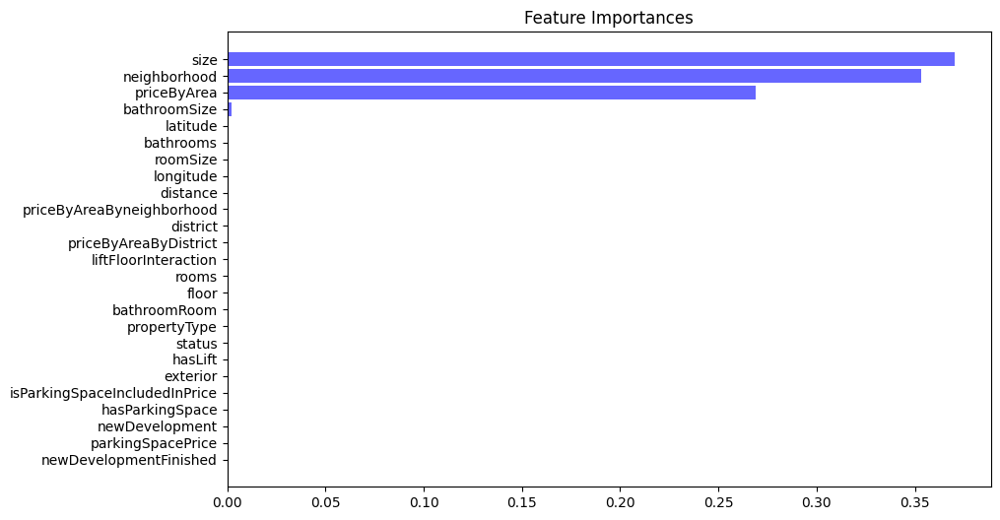

RMSE: 14012.6
MAE: 5285.26
R²: 0.9956
MAPE: 0.015

Resultados de Modelo GradientBoostingRegressor con TargetEncoder
Mejores hiperparámetros: {'regressor__subsample': 0.6, 'regressor__n_estimators': 250, 'regressor__min_samples_split': 8, 'regressor__min_samples_leaf': 7, 'regressor__max_depth': 9, 'regressor__learning_rate': 0.021544346900318832}
Cantidad de valores (7692, 25)

Importancia de las características:
                          Feature    Importance
1                            size  3.730307e-01
23                   neighborhood  3.495428e-01
10                    priceByArea  2.713895e-01
4                       bathrooms  1.670628e-03
18                   bathroomSize  1.540405e-03
5                        latitude  6.679115e-04
17                       roomSize  3.271804e-04
16      priceByAreaByneighborhood  2.874597e-04
15          priceByAreaByDistrict  2.706942e-04
6                       longitude  2.598768e-04
7                        distance  2.516038e-04
22     

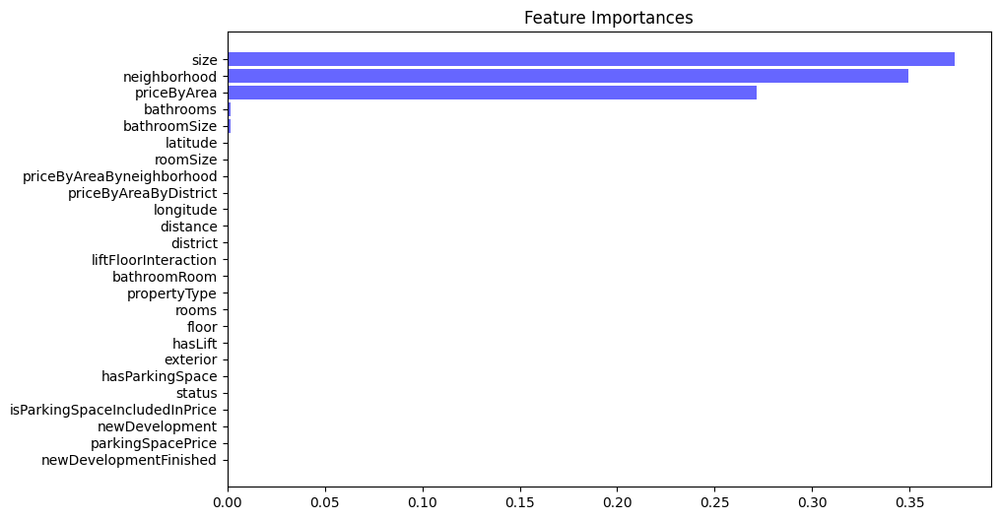

RMSE: 11152.25
MAE: 4154.25
R²: 0.9972
MAPE: 0.0125

Resultados de Modelo XGBRegressor con TargetEncoder
Mejores hiperparámetros: {'regressor__subsample': 0.8, 'regressor__n_estimators': 300, 'regressor__max_depth': 7, 'regressor__learning_rate': 0.021544346900318832, 'regressor__gamma': 3.0, 'regressor__colsample_bytree': 1.0}
Cantidad de valores (7692, 25)

Importancia de las características:
                          Feature  Importance
23                   neighborhood    0.752067
1                            size    0.124810
10                    priceByArea    0.090430
4                       bathrooms    0.009129
20           liftFloorInteraction    0.003875
15          priceByAreaByDistrict    0.003739
18                   bathroomSize    0.002437
3                           rooms    0.002089
22                       district    0.001694
5                        latitude    0.001513
12                hasParkingSpace    0.001502
21                   propertyType    0.001215
9   

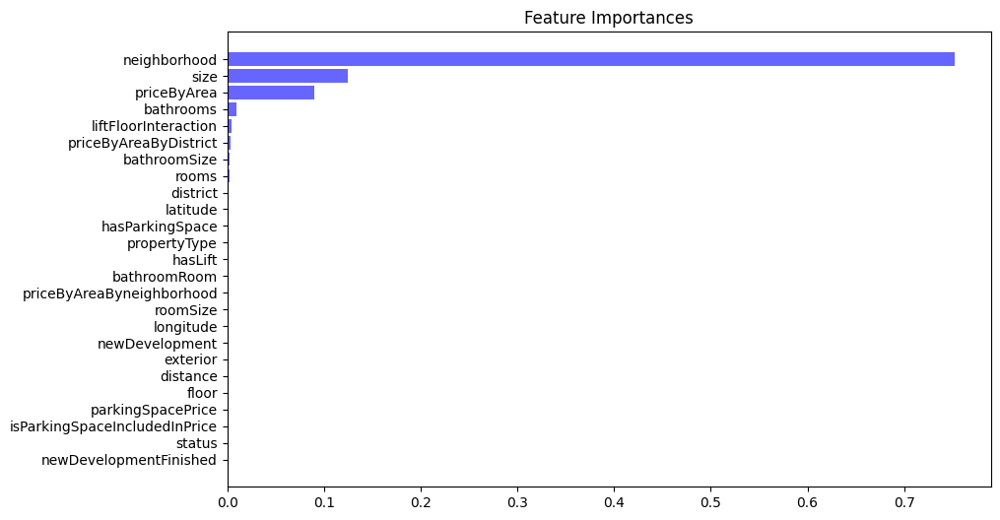

RMSE: 10523.66
MAE: 5067.87
R²: 0.9975
MAPE: 0.0146



In [22]:
# Leemos el Dataframe
data = feature_engineering_df[(feature_engineering_df['province']=='Madrid') & (feature_engineering_df['price']<=850000)]
# Select target
y =data['price']
# Eliminamos las columnas que no usaremos en X
X = data.drop(['propertyCode','price','Month','province'], axis=1) 
# Guardamos las variables númercias
numeric_features=list(X.select_dtypes(exclude=['object']).columns)
# Guardamos las variables categóricas
categorical_features=list(X.select_dtypes(include=['object']).columns)
# Divide data into training and validation subsets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size=0.8, test_size=0.2,random_state=42)


# Correr modelo de RandomForestRegressor Optimizado 
print(optimize_RandomForestRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid))
# Correr modelo de GradientBoostingRegressor Optimizado 
print(optimize_GradientBoostingRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid))
# Correr modelo de XGBRegressor Optimizado 
print(optimize_XGBRegressor_w_TargetEncoder(numeric_features, categorical_features, X_train, X_valid, y_train, y_valid))

In [29]:
best_params_RandomForestRegressor= {'regressor__n_estimators': 150, 'regressor__min_samples_split': 2, 'regressor__min_samples_leaf': 1, 'regressor__max_features': None, 'regressor__max_depth': 80, 'regressor__bootstrap': True}


best_params_GradientBoostingRegressor={'regressor__subsample': 0.6, 'regressor__n_estimators': 250, 'regressor__min_samples_split': 8, 'regressor__min_samples_leaf': 7, 'regressor__max_depth': 9, 'regressor__learning_rate': 0.021544346900318832}

best_params_XGBRegressor ={'regressor__subsample': 0.8, 'regressor__n_estimators': 300, 'regressor__max_depth': 7, 'regressor__learning_rate': 0.021544346900318832, 'regressor__gamma': 3.0, 'regressor__colsample_bytree': 1.0}

Variables numéricas:['priceByArea', 'size', 'bathrooms']
Variables categóricas:['neighborhood']

Resultados de Modelo XGBRegressor con TargetEncoder
Mejores hiperparámetros: {'regressor__colsample_bytree': 0.8416317594127292, 'regressor__gamma': 3.0499832889131047, 'regressor__learning_rate': 0.17663898234723288, 'regressor__max_depth': 5, 'regressor__n_estimators': 255, 'regressor__subsample': 0.6955303037866204}
Cantidad de valores (7387, 8)
RMSE: 10560.22
MAE: 6587.16
R²: 0.9969
MAPE 0.0214


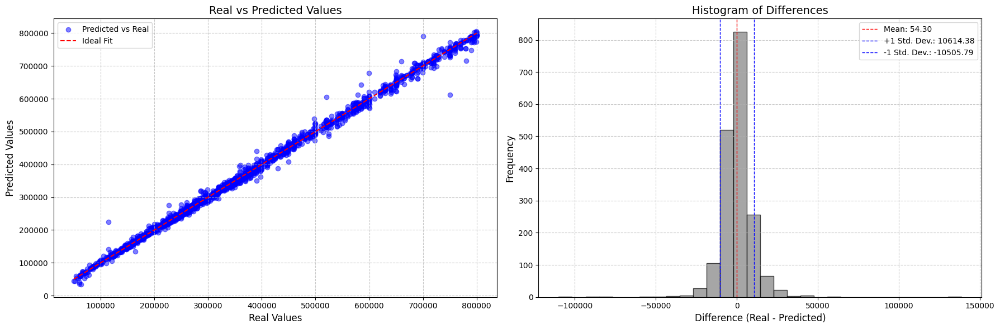

None


,propertyCode,Predicted_Price,price,Difference
1812,106360986,317890.500000,286000.0,-31890.500000
1201,106734398,612145.375000,578909.0,-33236.375000
224,107016847,319617.718750,286000.0,-33617.718750
894,105852828,683957.437500,650000.0,-33957.437500
126,104710479,393727.218750,358000.0,-35727.218750
916,106610606,397348.593750,360000.0,-37348.593750
619,106524714,539162.875000,497000.0,-42162.875000
831,106733030,276353.843750,227000.0,-49353.843750
590,106701408,439980.500000,390000.0,-49980.500000
497,106753411,713815.687500,660000.0,-53815.687500


In [30]:
def optimize_XGBR_with_TargetEncoder_feature_importance(data):
    # Filtra los datos para Madrid y precios <= 800000
    data = data[data['province'] == 'Madrid']
    data = data[data['price'] <= 800000]
    
    # Selecciona las características (X) y la variable objetivo (y)
    X = data.drop(['propertyCode', 'price', 'Month', 'province', 'longitude', 'roomSize', 'latitude', 'distance',
                   'priceByAreaByneighborhood', 'floor', 'district', 'liftFloorInteraction', 'priceByAreaByDistrict',
                   'bathroomRoom', 'parkingSpacePrice', 'rooms', 'propertyType', 'status', 'isParkingSpaceIncludedInPrice',
                   'hasParkingSpace', 'hasLift', 'bathroomSize'], axis=1)
    y = data['price']

    # Guarda el índice original para poder hacer el merge después
    X['propertyCode'] = data['propertyCode']

    # Divide los datos en conjuntos de entrenamiento y validación
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=42)

    # Define transformaciones para las variables categóricas y numéricas
    categorical_features = ['neighborhood']
    categorical_transformer = ce.TargetEncoder()

    numeric_features = ['priceByArea', 'size', 'bathrooms']
    numeric_transformer = StandardScaler()

    # Define el preprocesamiento de las características
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ])

    # Combina preprocesamiento y modelo en un pipeline
    model = Pipeline(steps=[('preprocessor', preprocessor),
                            ('regressor', XGBRegressor(random_state=42))])

    # Define la distribución de hiperparámetros para la búsqueda aleatoria
    param_dist = {
        'regressor__n_estimators': randint(50, 300),
        'regressor__max_depth': randint(3, 21),
        'regressor__learning_rate': uniform(0.01, 0.2),
        'regressor__subsample': uniform(0.5, 0.5),  # Ahora está limitado entre 0.5 y 1.0
        'regressor__colsample_bytree': uniform(0.5, 0.5),  # Ahora está limitado entre 0.5 y 1.0
        'regressor__gamma': uniform(0, 5)
    }

    # Aplica la búsqueda aleatoria de hiperparámetros
    random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=50, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)
    random_search.fit(X_train.drop(columns='propertyCode'), y_train)

    # Obtiene el mejor modelo
    best_model = random_search.best_estimator_

    # Evalúa el modelo en el conjunto de prueba
    y_pred = best_model.predict(X_valid.drop(columns='propertyCode'))

    # Calcular métricas
    mae = mean_absolute_error(y_valid, y_pred)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    r2 = r2_score(y_valid, y_pred)
    mape = mean_absolute_percentage_error(y_valid, y_pred)
    
    # Formatear métricas con dos decimales
    mae = round(mae, 2)
    rmse = round(rmse, 2)
    r2 = round(r2, 4)
    mape = round(mape, 4)

    # Mostrar las variables usadas en el modelo
    print(f"Variables numéricas:{numeric_features}")
    print(f"Variables categóricas:{categorical_features}\n")
    # Imprimir resultados
    print("Resultados de Modelo XGBRegressor con TargetEncoder")
    print(f"Mejores hiperparámetros: {random_search.best_params_}")
    print(f"Cantidad de valores {X_train.shape}")
    print("RMSE:", rmse)
    print("MAE:", mae)
    print("R²:", r2)
    print("MAPE", mape)

    # Crear un DataFrame con las predicciones y el propertyCode
    results_df = pd.DataFrame({'propertyCode': X_valid['propertyCode'], 'Predicted_Price': y_pred})

    # Hacer un merge con el DataFrame original para obtener los precios reales
    feature_importance_merged_df_Difference = pd.merge(results_df, data[['propertyCode', 'price']], on='propertyCode', how='inner')

    # Agregar una columna para la diferencia entre el precio real y el predicho
    feature_importance_merged_df_Difference['Difference'] = feature_importance_merged_df_Difference['price'] - feature_importance_merged_df_Difference['Predicted_Price']

    return feature_importance_merged_df_Difference

# Corremos el modelo con las variables más importantes
feature_importance_merged_df_Difference_XGBRegressor  = optimize_XGBR_with_TargetEncoder_feature_importance(feature_engineering_df)

print(plot_real_vs_predicted_and_histogram(feature_importance_merged_df_Difference_XGBRegressor))

# Imprimir top 15 inmuebles subvaluados
feature_importance_merged_df_Difference_XGBRegressor.sort_values(by='Difference',ascending=False).tail(15)

In [31]:
mean_priceByArea[mean_priceByArea['neighborhood'] == 'Lavapiés-Embajadores']

,status,neighborhood,priceByArea
67,good,Lavapiés-Embajadores,5553.525745
167,newdevelopment,Lavapiés-Embajadores,7743.000000
269,renew,Lavapiés-Embajadores,4653.600000


In [33]:
feature_importance_merged_df_Difference_XGBRegressor[feature_importance_merged_df_Difference_XGBRegressor['price']<=300000].sort_values(by='Difference',ascending=False).tail(20)

,propertyCode,Predicted_Price,price,Difference
1664,106813601,275430.281250,260000.0,-15430.281250
1545,99923878,265607.687500,250000.0,-15607.687500
975,106739080,120995.937500,105000.0,-15995.937500
515,103940608,251212.296875,235000.0,-16212.296875
923,106903267,292462.625000,275000.0,-17462.625000
844,106733440,313074.843750,295000.0,-18074.843750
793,106594763,217885.078125,199500.0,-18385.078125
235,107190782,178503.453125,160000.0,-18503.453125
685,106830273,315152.656250,295000.0,-20152.656250
43,106536441,212085.781250,189000.0,-23085.781250


In [34]:
# Definir la ruta completa donde se guardará el archivo
ruta = r'C:\Users\nicol\OneDrive\Documentos\VSCLocal\Data\Pisos subvaluados\pisos_subvaluados.xlsx'

# Guardar el DataFrame en el archivo Excel con la hoja 'Pisos Subvaluados'
with pd.ExcelWriter(ruta) as writer:
    feature_importance_merged_df_Difference_XGBRegressor.to_excel(writer, sheet_name='Pisos Subvaluados', index=False)

print(f"El archivo se ha guardado exitosamente en: {ruta}")

El archivo se ha guardado exitosamente en: C:\Users\nicol\OneDrive\Documentos\VSCLocal\Data\Pisos subvaluados\pisos_subvaluados.xlsx


In [27]:

# Asumiendo que el DataFrame feature_engineering_df ya está cargado

def optimize_GBR_with_TargetEncoder_feature_importance(data):
    # Filtra los datos para Madrid y precios <= 800000
    data = data[data['province'] == 'Madrid']
    data = data[data['price'] <= 800000]
    
    # Selecciona las características (X) y la variable objetivo (y)
    X = data.drop(['propertyCode', 'price', 'Month', 'province', 'longitude', 'roomSize', 'latitude', 'distance',
                   'priceByAreaByneighborhood', 'floor', 'district', 'liftFloorInteraction', 'priceByAreaByDistrict',
                   'bathroomRoom', 'parkingSpacePrice', 'rooms', 'propertyType', 'status', 'isParkingSpaceIncludedInPrice',
                   'hasParkingSpace', 'hasLift'], axis=1)
    y = data['price']

    # Guarda el índice original para poder hacer el merge después
    X['propertyCode'] = data['propertyCode']

    # Divide los datos en conjuntos de entrenamiento y validación
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=42)

    # Define transformaciones para las variables categóricas y numéricas
    categorical_features = ['neighborhood']
    categorical_transformer = ce.TargetEncoder()

    numeric_features = ['priceByArea', 'size', 'bathrooms', 'bathroomSize']
    numeric_transformer = StandardScaler()

    # Define el preprocesamiento de las características
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ])

    # Combina preprocesamiento y modelo en un pipeline
    model = Pipeline(steps=[('preprocessor', preprocessor),
                            ('regressor', GradientBoostingRegressor(random_state=42))])

    # Define la distribución de hiperparámetros para la búsqueda aleatoria
    param_dist = {
        'regressor__n_estimators': randint(50, 300),
        'regressor__max_depth': randint(3, 21),
        'regressor__learning_rate': uniform(0.01, 0.2),
        'regressor__subsample': uniform(0.5, 0.5),
        'regressor__min_samples_split': randint(2, 20),
        'regressor__min_samples_leaf': randint(1, 20)
    }

    # Aplica la búsqueda aleatoria de hiperparámetros
    random_search = RandomizedSearchCV(model, param_distributions=param_dist, n_iter=50, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)
    random_search.fit(X_train.drop(columns='propertyCode'), y_train)

    # Obtiene el mejor modelo
    best_model = random_search.best_estimator_

    # Evalúa el modelo en el conjunto de prueba
    y_pred = best_model.predict(X_valid.drop(columns='propertyCode'))

    # Calcular métricas
    mae = mean_absolute_error(y_valid, y_pred)
    rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
    r2 = r2_score(y_valid, y_pred)
    mape = mean_absolute_percentage_error(y_valid, y_pred)
    
    # Formatear métricas con dos decimales
    mae = round(mae, 2)
    rmse = round(rmse, 2)
    r2 = round(r2, 4)
    mape = round(mape, 4)

    # Mostrar las variables usadas en el modelo
    print(f"Variables numéricas:{numeric_features}")
    print(f"Variables categóricas:{categorical_features}\n")
    # Imprimir resultados
    print("Resultados de Modelo GradientBoostingRegressor con TargetEncoder")
    print(f"Mejores hiperparámetros: {random_search.best_params_}")
    print(f"Cantidad de valores {X_train.shape}")
    print("RMSE:", rmse)
    print("MAE:", mae)
    print("R²:", r2)
    print("MAPE", mape)

    # Almacena el mejor modelo para su uso posterior
    best_model.fit(X.drop(columns='propertyCode'), y)
    return best_model

# Entrena el modelo
best_model = optimize_GBR_with_TargetEncoder_feature_importance(feature_engineering_df)

def predict_price(neighborhood, priceByArea, size, bathrooms, bathroomSize):
    # Crear un DataFrame con las características de entrada
    input_data = pd.DataFrame({
        'neighborhood': [neighborhood],
        'priceByArea': [priceByArea],
        'size': [size],
        'bathrooms': [bathrooms],
        'bathroomSize': [bathroomSize]
    })
    
    # Hacer la predicción usando el mejor modelo entrenado
    predicted_price = best_model.predict(input_data)
    
    return predicted_price[0]

# Ejemplo de uso
neighborhood = "Nuevos Ministerios-Ríos Rosas"
priceByArea = 5357.14
size = 140
bathrooms = 2
bathroomSize = size/bathrooms

predicted_price = predict_price(neighborhood, priceByArea, size, bathrooms, bathroomSize)
print(f"El precio estimado es: {predicted_price}")


Variables numéricas:['priceByArea', 'size', 'bathrooms', 'bathroomSize']
Variables categóricas:['neighborhood']

Resultados de Modelo GradientBoostingRegressor con TargetEncoder
Mejores hiperparámetros: {'regressor__learning_rate': 0.01737738947090656, 'regressor__max_depth': 19, 'regressor__min_samples_leaf': 2, 'regressor__min_samples_split': 3, 'regressor__n_estimators': 269, 'regressor__subsample': 0.5257393756249946}
Cantidad de valores (7387, 9)
RMSE: 7123.44
MAE: 3179.55
R²: 0.9986
MAPE 0.0113
El precio estimado es: 746095.4046882235


In [28]:
neighborhood = "Nuevos Ministerios-Ríos Rosas"
priceByArea = 5357.14
size = 70
bathrooms = 1.5
bathroomSize = size/bathrooms

predicted_price = predict_price(neighborhood, priceByArea, size, bathrooms, bathroomSize)
print(f"El precio estimado es: {predicted_price}")

El precio estimado es: 374748.88184374437
